In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
from pykrige.ok import OrdinaryKriging
from pykrige.kriging_tools import write_asc_grid
import pykrige.kriging_tools as kt
import seaborn as sns

In [2]:
# Default plot settings
plt.rcParams["figure.dpi"] = 300
sns.set()

In [3]:
data = pd.read_csv("data/karnataka_temperature.csv")


In [4]:
random_seed = 42
np.random.seed(random_seed)

In [5]:
print(f"Data shape: {data.shape}\nColumns: {data.columns.values}")

Data shape: (223, 4)
Columns: ['taluka' 'temperature' 'longitude' 'latitude']


In [6]:
# Convert data to numpy
data = data[["longitude","latitude","temperature"]]
np_data = np.array(data)

# Split randomly into train and test arrays
train_size = 0.5
train_data = data.sample(frac = train_size)
validation_data = data.drop(train_data.index)

np_tr = np.array(train_data)
np_val = np.array(validation_data)

print(np_tr.shape, np_val.shape)

# Retrieve longitude, latitude and actuals(temperature)
train_lon,train_lat,z_train_actuals = np_tr[:,0], np_tr[:,1], np_tr[:,2]
valid_lon,valid_lat,z_valid_actuals = np_val[:,0], np_val[:,1], np_val[:,2]
data_lon,data_lat,z_data_actuals = np_data[:,0], np_data[:,1], np_data[:,2]

(112, 3) (111, 3)


Points outside the Karnataka boundary:
Empty GeoDataFrame
Columns: [longitude, latitude, temperature, geometry]
Index: []


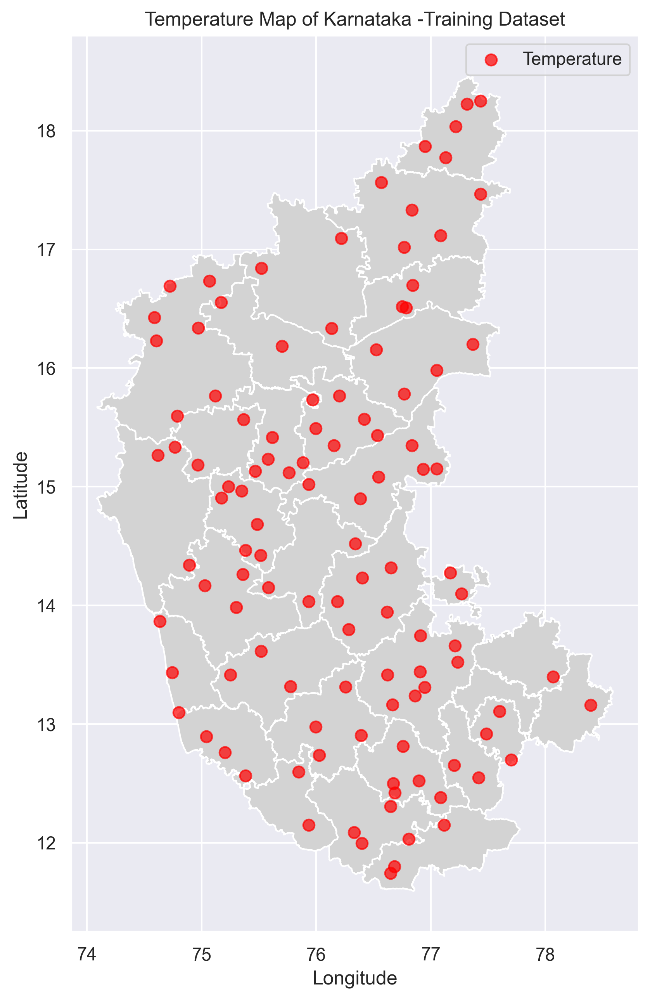

In [7]:
# Read the shapefile of Karnataka
karnataka_map = gpd.read_file("data/Karnataka shapefile.shp")

# Convert the DataFrame into a GeoDataFrame
geometry = gpd.points_from_xy(train_data.longitude, train_data.latitude)
gdf = gpd.GeoDataFrame(train_data, geometry=geometry)

# Set CRS for the GeoDataFrame
gdf.crs = karnataka_map.crs

# Reproject the GeoDataFrame to match the shapefile CRS
gdf_reprojected = gdf.to_crs(karnataka_map.crs)

# Check if points are within the shapefile boundary
points_within_boundary = gpd.sjoin(gdf_reprojected, karnataka_map, predicate="within")

# Identify points outside the boundary
points_outside_boundary = gdf_reprojected[~gdf_reprojected.index.isin(points_within_boundary.index)]

print("Points outside the Karnataka boundary:")
print(points_outside_boundary)


# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
karnataka_map.plot(ax=ax, color="lightgrey")
gdf.plot(ax=ax, marker="o", color="red", markersize=50, alpha=0.7, label="Temperature")

# Customize plot appearance
ax.set_title("Temperature Map of Karnataka -Training Dataset")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()

plt.show()


In [8]:
OK = OrdinaryKriging(train_lon, train_lat, z_train_actuals, variogram_model='gaussian', verbose=True, enable_plotting=False,nlags=20)


Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'gaussian' Variogram Model
Partial Sill: 4.8182222445717215
Full Sill: 6.112224935019041
Range: 6.352522689016957
Nugget: 1.2940026904473192 

Calculating statistics on variogram model fit...


In [9]:
z_val, ss1_val = OK.execute('grid', valid_lon, valid_lat)
z_val_pred_kriging = np.array([z_val[i,i] for i in range(np_val.shape[0])])

mae_val_kriging = np.average(abs(z_valid_actuals - z_val_pred_kriging)) 
rmse_val_kriging = np.sqrt(np.average((z_valid_actuals - z_val_pred_kriging)**2))
print(f"Mean Absolute Error on validation set: {mae_val_kriging:0.4f}")
print(f"RMSE on validation set: {rmse_val_kriging:0.4f}")

Executing Ordinary Kriging...

Mean Absolute Error on validation set: 1.1540
RMSE on validation set: 1.5186


##### Spatial Interpolation

In [10]:
def normalize(x:np.array)->np.array:
    mean = np.mean(x, axis = 0)
    std = np.std(x, axis = 0)
    return mean, std, (x - mean)/std

def w(x:np.array, y:np.array, xk:np.array, yk:np.array, 
      alpha:float=1, beta:float=2)->np.array:
    if alpha <=0 or beta<=0:
        print("alpha and beta values should be greater than 0!!")
    else:
        return (abs((x-xk)**beta) + abs((y-yk)**beta))**alpha
    
def spatial_interpol(pred_data:np.array, train_data:np.array, 
                alpha:float=1.0, beta:float=2.0, kappa:float = 2.0, 
                eps:float=1.0e-8, delta:float = 1.0e-8 + 1.2 * 2)->np.array:
    
    # Rows in the training dataset
    n = train_data.shape[0]
    
    # Retrieve first 2 columns from the test dataset
    x, y = pred_data[:, 0], pred_data[:, 1]
    z = 0.0
    gamma_sum = 0.0
        
    for k in range(n):
        xk, yk, zk = train_data[k,:]
        gamma_k = 1.0
        for i in range(n):
            xi, yi, _ = train_data[i, :]
            if i!=k:
                gamma_k *= w(x, y, xi, yi, alpha, beta) / \
                        (w(xk, yk, xi, yi, alpha, beta) + eps)
                #print(f"Iteration {i}: {gamma_k}")
        dist = w(x, y, xk, yk, alpha, beta)   
        gamma_k = (eps + dist)**(-kappa) * gamma_k/(1 + gamma_k)
        gamma_k[dist > delta] = 0.0                  
        gamma_sum += gamma_k
        z += gamma_k * zk
    return z / (gamma_sum + eps)

##### Evaluation on Validation Set

In [11]:
print(np_tr.shape, np_val.shape)
z_val_pred_interpol = spatial_interpol(np_val,np_tr)
mae_val_interpol = np.average(abs(z_valid_actuals - z_val_pred_interpol)) 
rmse_val_interpol = np.sqrt(np.average((z_valid_actuals - z_val_pred_interpol)**2))
print(f"Mean Absolute Error on validation set: {mae_val_interpol:0.4f}")
print(f"Mean Absolute Error on validation set: {rmse_val_interpol:0.4f}")


(112, 3) (111, 3)
Mean Absolute Error on validation set: 0.7756
Mean Absolute Error on validation set: 1.1055


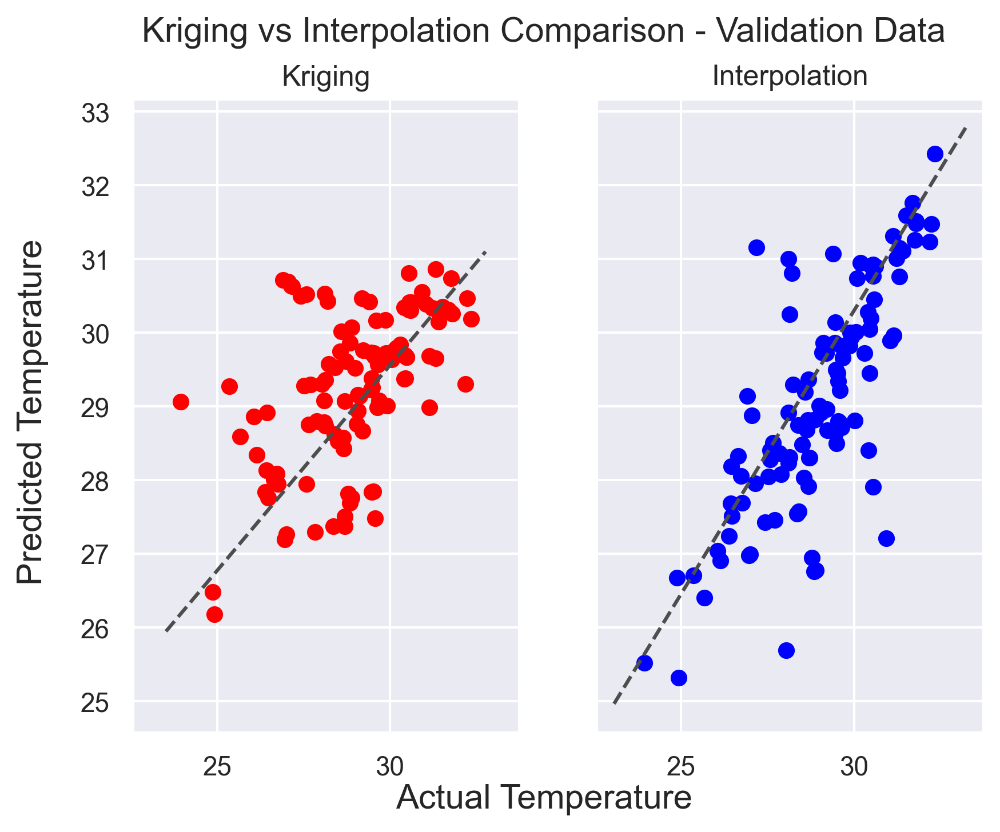

In [12]:
fig , ax = plt.subplots(1,2, sharex=True, sharey=True)
fig.suptitle("Kriging vs Interpolation Comparison - Validation Data")
fig.supxlabel("Actual Temperature")
fig.supylabel("Predicted Temperature")
ax[0].scatter(z_valid_actuals,z_val_pred_kriging, color="red",label="kriging")
ax[0].plot(ax[0].get_xlim(), ax[0].get_ylim(), ls="--", c=".3")
ax[0].set_title("Kriging")
ax[1].scatter(z_valid_actuals,z_val_pred_interpol, color="blue", label="interpolation")
ax[1].plot(ax[1].get_xlim(), ax[1].get_ylim(), ls="--", c=".3")
ax[1].set_title("Interpolation")
plt.show()


##### Evaluation on the Training Dataset

##### <u>Kriging</u>

In [13]:
z_train, ss1_train = OK.execute('grid', train_lon, train_lat)

z_train_pred_kriging = np.array([z_train[i,i] for i in range(np_tr.shape[0])])

mae_train_kriging = np.average(abs(z_train_actuals - z_train_pred_kriging)) 
rmse_train_kriging = np.sqrt(np.average((z_train_actuals - z_train_pred_kriging)**2))
print(f"Mean Absolute Error on validation set: {mae_train_kriging:0.4f}")
print(f"RMSE on validation set: {rmse_train_kriging:0.4f}")

Executing Ordinary Kriging...

Mean Absolute Error on validation set: 0.0000
RMSE on validation set: 0.0000


##### <u>Interpolation</u>

In [14]:
z_train_pred_interpol = spatial_interpol(np_tr,np_tr)
mae_train_interpol = np.average(abs(z_train_actuals - z_train_pred_interpol)) 
rmse_train_interpol = np.sqrt(np.average((z_train_actuals - z_train_pred_interpol)**2))
print(f"Mean Absolute Error on validation set: {mae_train_interpol:0.4f}")
print(f"Mean Absolute Error on validation set: {rmse_train_interpol:0.4f}")

Mean Absolute Error on validation set: 0.0000
Mean Absolute Error on validation set: 0.0000


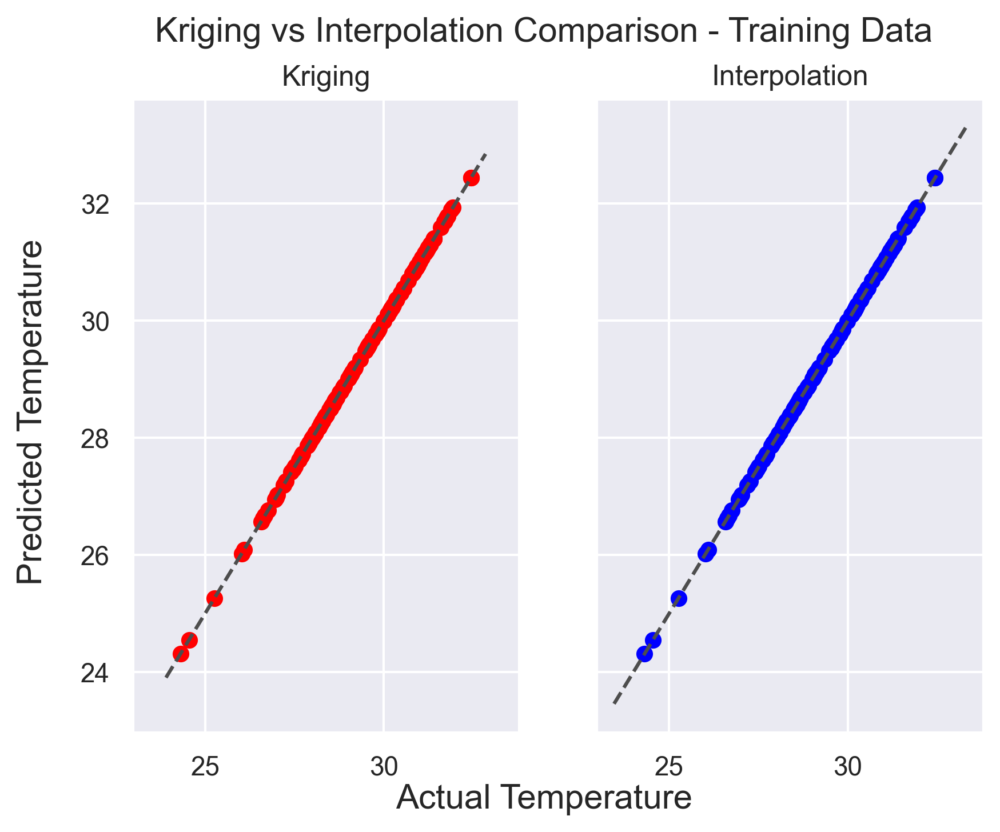

In [15]:
fig , ax = plt.subplots(1,2, sharex=True, sharey=True)
fig.suptitle("Kriging vs Interpolation Comparison - Training Data")
fig.supxlabel("Actual Temperature")
fig.supylabel("Predicted Temperature")
ax[0].scatter(z_train_actuals,z_train_pred_kriging, color="red",label="kriging")
ax[0].plot(ax[0].get_xlim(), ax[0].get_ylim(), ls="--", c=".3")
ax[0].set_title("Kriging")
ax[1].scatter(z_train_actuals,z_train_pred_interpol, color="blue", label="interpolation")
ax[1].plot(ax[1].get_xlim(), ax[1].get_ylim(), ls="--", c=".3")
ax[1].set_title("Interpolation")
plt.show()

##### Training + Validation Plot (Kriging)

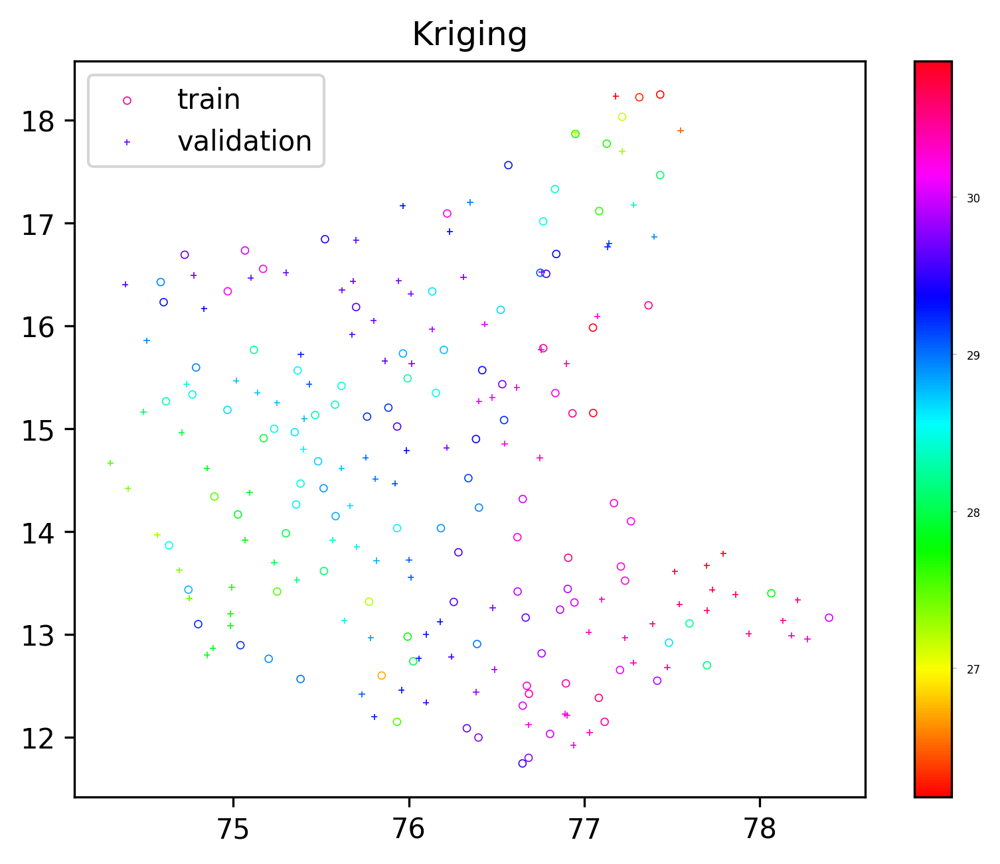

In [16]:
sns.reset_defaults()
plt.rcParams["figure.dpi"] = 300
my_cmap = mpl.colormaps['hsv'] 
my_norm = mpl.colors.Normalize()
ec_colors = my_cmap(my_norm(np_tr[:,2]))
sc2a = plt.scatter(np_tr[:,0], np_tr[:,1], c='white', s=7, 
    edgecolors=ec_colors,linewidth=0.4, label="train")

sc2b = plt.scatter(np_val[:,0], np_val[:,1], c=z_val_pred_kriging, cmap=my_cmap, marker='+',s=5,linewidth=0.4, label="validation")
cbar1 = plt.colorbar(sc2b)
cbar1.ax.tick_params(width=0.1) 
cbar1.ax.tick_params(length=2) 
cbar1.ax.tick_params(labelsize=4)
plt.legend()
plt.title("Kriging")
plt.show()

#### Validation + Training Plot (Interpolation)

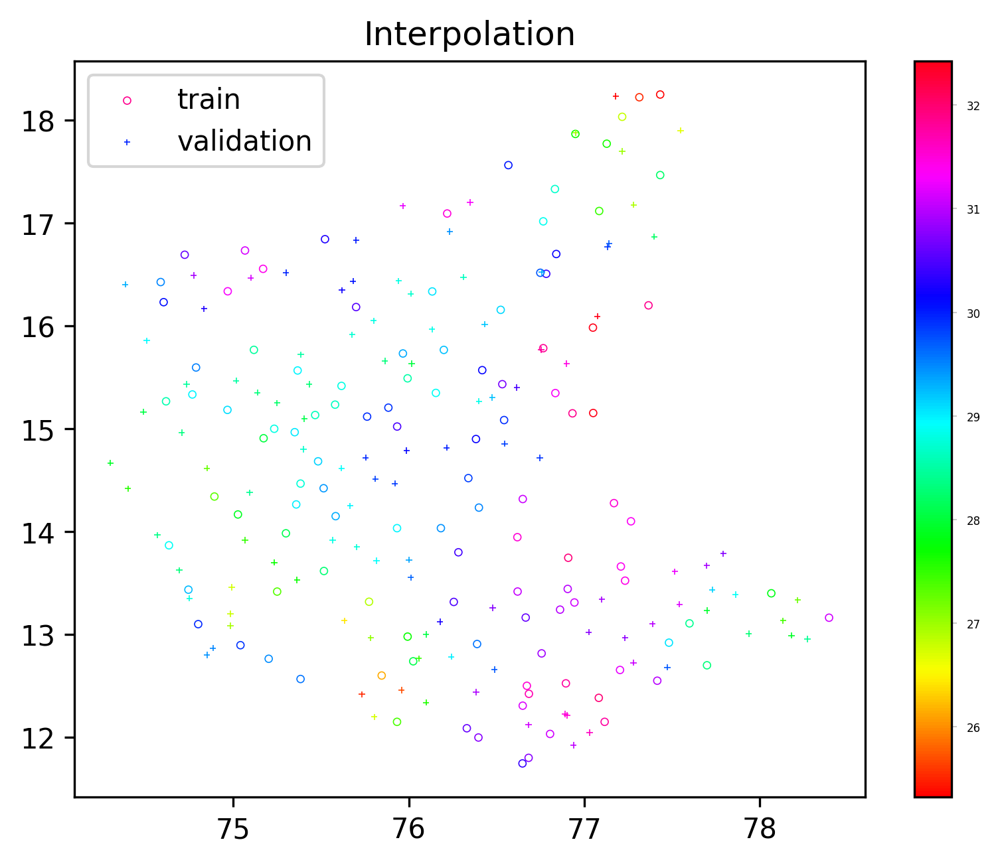

In [17]:
sns.reset_defaults()
plt.rcParams["figure.dpi"] = 300
my_cmap = mpl.colormaps['hsv'] 
my_norm = mpl.colors.Normalize()
ec_colors = my_cmap(my_norm(np_tr[:,2]))
sc2a = plt.scatter(np_tr[:,0], np_tr[:,1], c='white', s=7, 
    edgecolors=ec_colors,linewidth=0.4, label="train")

sc2b = plt.scatter(np_val[:,0], np_val[:,1], c=z_val_pred_interpol, cmap=my_cmap, marker='+',s=5,linewidth=0.4, label="validation")
cbar1 = plt.colorbar(sc2b)
cbar1.ax.tick_params(width=0.1) 
cbar1.ax.tick_params(length=2) 
cbar1.ax.tick_params(labelsize=4)
plt.legend()
plt.title("Interpolation")
plt.show()

In [18]:
results_list = []
results_list.append(("kriging", "test data", mae_val_kriging, rmse_val_kriging))
results_list.append(("interpolation", "test data", mae_val_interpol, rmse_val_interpol))
results_list.append(("kriging", "train data", mae_train_kriging, rmse_train_kriging))
results_list.append(("interpolation", "train data", mae_train_interpol, rmse_train_interpol))

results = pd.DataFrame(results_list, columns=["method","validated on","mae", "rmse"])
results

,method,validated on,mae,rmse
0,kriging,test data,1.154007e+00,1.518650e+00
1,interpolation,test data,7.755672e-01,1.105472e+00
2,kriging,train data,1.650426e-13,1.984742e-13
3,interpolation,train data,1.205385e-15,2.069393e-15


##### Generate grids for latitudes & longitudes

In [19]:
# get the boundary of Karnataka 
xmin, ymin, xmax, ymax = karnataka_map.total_bounds

xmin = xmin-0.01
xmax = xmax+0.01

ymin = ymin-0.01
ymax = ymax+0.01

grid_lon = np.linspace(xmin, xmax, 100)
grid_lat = np.linspace(ymin, ymax, 100)

##### Run Kriging on Grid locations

In [20]:
# Run Kriging on Grid lon & lat
z_data, ss1_data = OK.execute('grid', grid_lon, grid_lat)

Executing Ordinary Kriging...



##### Kriging - Grid points (physical location + color scale) 

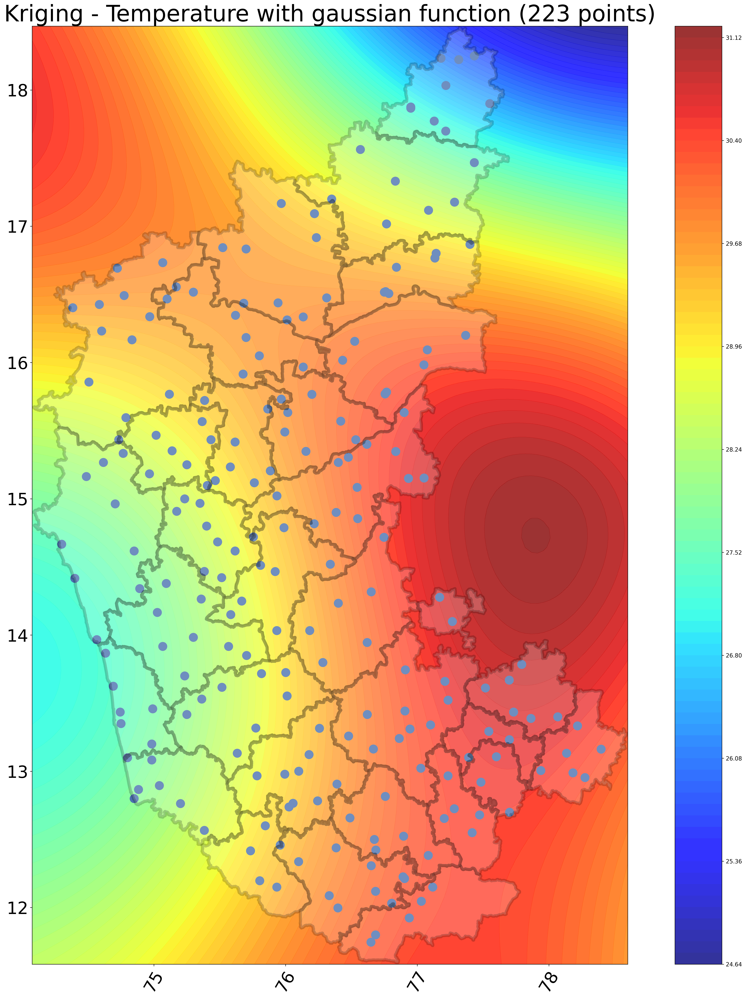

In [21]:
xintrp, yintrp = np.meshgrid(grid_lon, grid_lat) 
fig, ax = plt.subplots(figsize=(30,30))

boundarygeom = karnataka_map.geometry

contour = plt.contourf(xintrp, yintrp, z_data,len(z_data),
                       cmap=plt.cm.jet,alpha = 0.8) 


plt.colorbar(contour)


karnataka_map.plot(ax=ax, color='white', alpha = 0.2, linewidth=5.5, edgecolor='black', zorder = 5)


npts = len(data_lon)

plt.scatter(data_lon, data_lat,marker='o',c='b',s=npts)


plt.xticks(fontsize = 30, rotation=60)
plt.yticks(fontsize = 30)

plt.title('Kriging - Temperature with gaussian function (%d points)' % npts,fontsize = 40)
plt.show()

##### Run Interpolation on Grid Locations

In [22]:
xc, yc = np.meshgrid(grid_lon, grid_lat)


zgrid = np.empty(shape=(100,100)) # for interpolated values at grid locations
xg = []
yg = []
gmap = {}
idx = 0
for h in range(len(grid_lon)):
    for k in range(len(grid_lat)):
        xg.append(grid_lon[h])
        yg.append(grid_lat[k])
        gmap[h, k] = idx
        idx += 1
        
z = spatial_interpol(np.stack((xg, yg),axis=1), np_tr)

for h in range(len(grid_lon)):
    for k in range(len(grid_lat)):
        idx = gmap[h, k]
        zgrid[h, k] = z[idx]
        
zgridt = zgrid.transpose()

print(zgridt.shape)

(100, 100)


##### Interpolation - Grid points (physical location + color scale) 

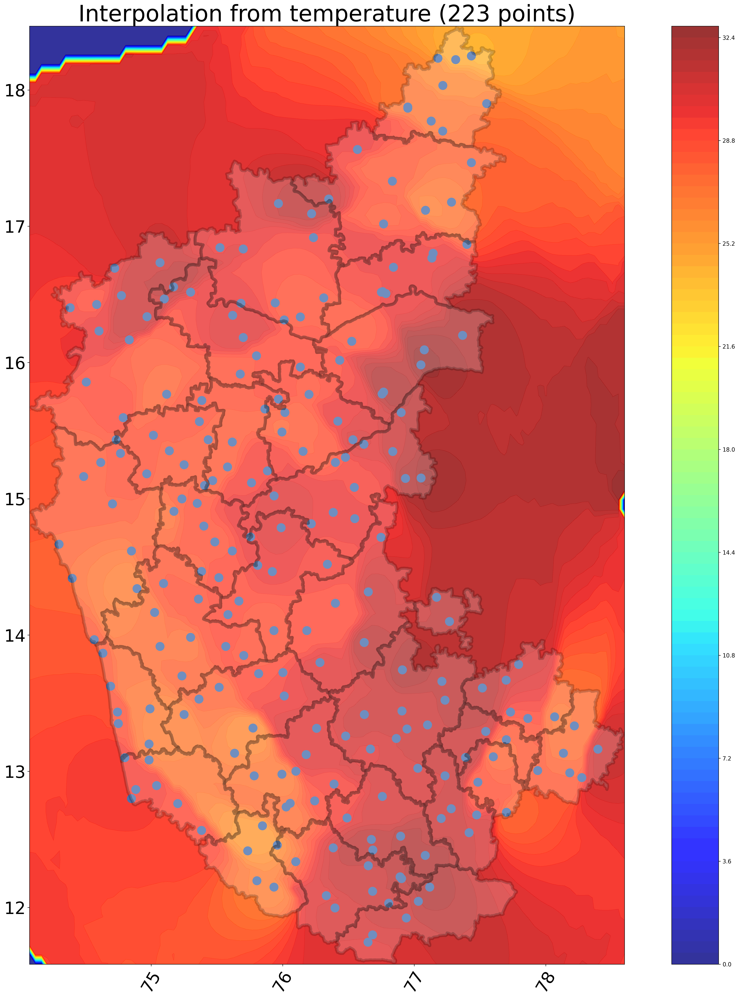

In [23]:
fig, ax = plt.subplots(figsize=(30,30))

boundarygeom = karnataka_map.geometry

contour = plt.contourf(xc, yc, zgridt,len(zgridt),cmap=plt.cm.jet,alpha = 0.8) 


plt.colorbar(contour)


karnataka_map.plot(ax=ax, color='white', alpha = 0.2, linewidth=5.5, edgecolor='black', zorder = 5)


npts = len(data_lon)

plt.scatter(data_lon, data_lat,marker='o',c='b',s=npts)

plt.xticks(fontsize = 30, rotation=60)
plt.yticks(fontsize = 30)

plt.title('Interpolation from temperature (%d points)' % npts,fontsize = 40)
plt.show()

#### Observations
* Custom Interpolation performs better on validation points than Kriging
* It does not assume any particular distribution in data for prediction
* Kriging produces a narrower ban of temperatures i.e. it over-smooths the values
* Kriging can extrapolate temperature values while Custom Interpolation cannot. Temperature estimation of a faraway point tends to 0 in case of Custom Interpolation and that is by design